In [64]:
from pathlib import Path
import torch
from torch import Tensor
from temp import image_from_patches, patches_from_image, PatchesInfo
import torchvision
from torchvision.transforms.functional import to_pil_image  # type: ignore

SAMPLES_DIR = Path("arw-samples")


def show_tensor(image: Tensor) -> None:
    assert image.is_floating_point()

    # Gross hack to make images visible
    image = (image * 255 * 16).clamp(0, 255)
    image = image.to(torch.uint8)

    display(to_pil_image(image))  # type: ignore


In [65]:
from mfsr_utils.pipelines.camera import mosaic_rgbg
from mfsr_utils.datasets.sony_arw import SonyArw

ds = SonyArw(SAMPLES_DIR, transform=lambda x: mosaic_rgbg(x.raw_image_visible))
mosaiced = ds[0]
mosaiced.shape

torch.Size([4, 1638, 2460])

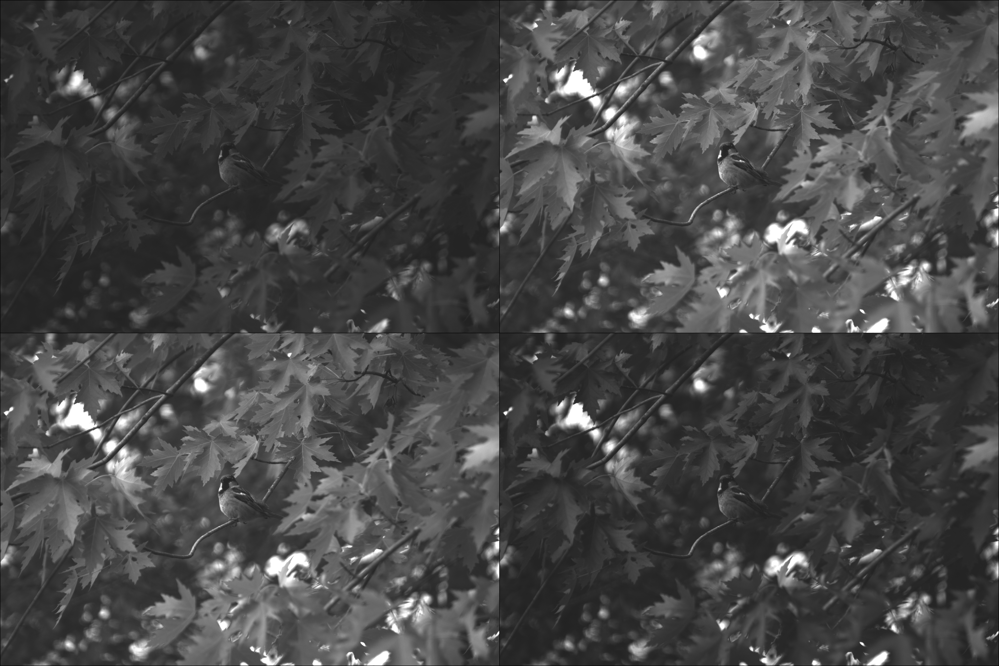

In [66]:
channel_grid = torchvision.utils.make_grid(mosaiced.unsqueeze(1), nrow=2)
show_tensor(channel_grid)


In [67]:
blue_channel = mosaiced[2].unsqueeze(0)
blue_channel_patches = patches_from_image(blue_channel, 128, 128)
blue_channel_patches.shape


torch.Size([1, 12, 19, 128, 128])

In [68]:
blue_channel_patches_info = PatchesInfo.of(blue_channel_patches)
blue_channel_patches_info


PatchesInfo(PH=128, PW=128, NHP=12, NWP=19, H=1536, W=2432)

In [69]:
blue_channel_patches_flattened = blue_channel_patches.reshape(
    # NHP * NWP, C (which is just 1 since it's a single channel), PH, PW
    -1,
    1,
    blue_channel_patches_info.PH,
    blue_channel_patches_info.PW,
)
blue_channel_patches_flattened.shape


torch.Size([228, 1, 128, 128])

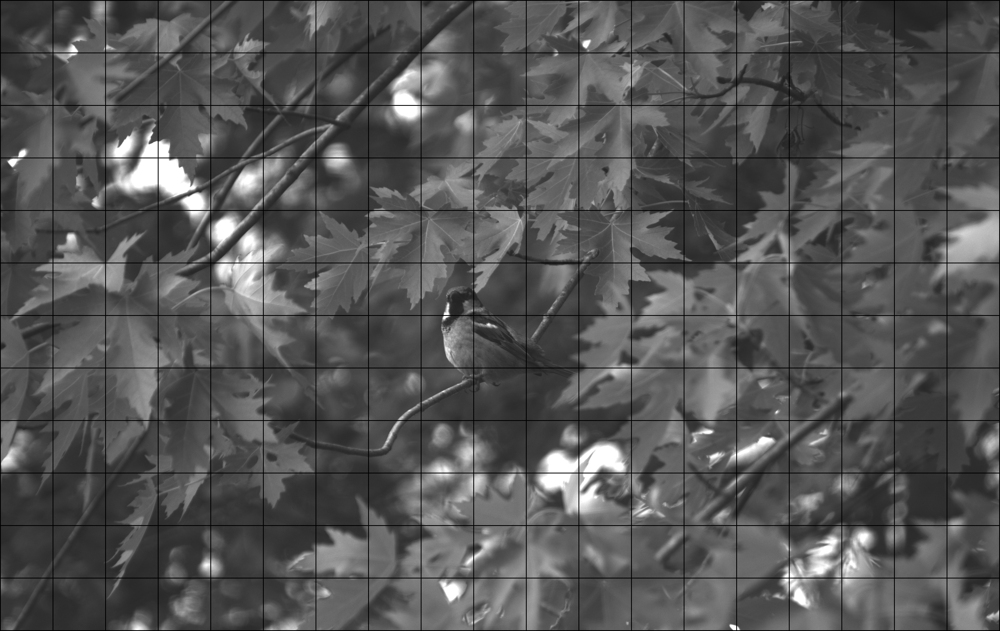

In [70]:
show_tensor(
    torchvision.utils.make_grid(
        blue_channel_patches_flattened,
        nrow=blue_channel_patches_info.NWP,
    )
)


In [71]:
blue_channel_patches_unflattened = blue_channel_patches_flattened.reshape(
    1,
    blue_channel_patches_info.NHP,
    blue_channel_patches_info.NWP,
    blue_channel_patches_info.PH,
    blue_channel_patches_info.PW,
)
blue_channel_patches_unflattened.shape


torch.Size([1, 12, 19, 128, 128])

In [72]:
back_to_tensor = image_from_patches(blue_channel_patches_unflattened)
back_to_tensor.shape


torch.Size([1, 1536, 2432])

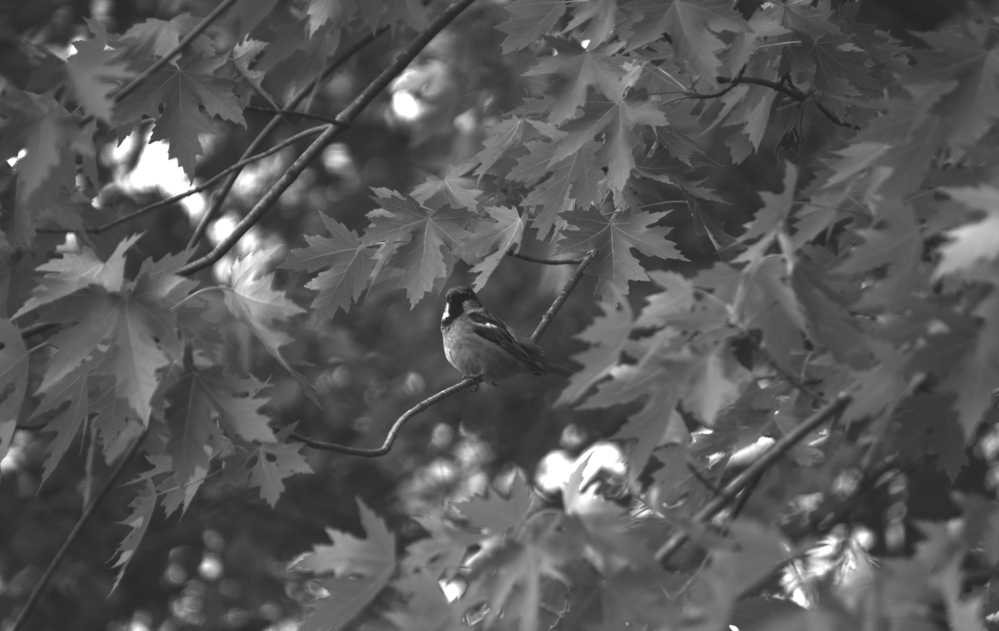

In [73]:
show_tensor(back_to_tensor)
